# Broadband Beamforming with Multi-Transition Platform Maneuver

This notebook demonstrates a complete passive sonar processing chain with **Target Motion Analysis (TMA)** observability:

1. **Broadband continuous signal generation** via STFT
2. **Acoustic propagation** with time-varying transfer functions
3. **Ambient noise modeling** with colored noise
4. **Frequency-domain delay-and-sum beamforming**
5. **CFAR detection** with peak finding
6. **Multi-transition platform motion** for range estimation

## Motion Scenario (from sc3.py)

This scenario is designed to create **observability for range estimation** through platform maneuvering:

- **Platform**: Multi-transition maneuver
  - Leg 1 (20 min): Straight-line motion at 10 m/s, heading -140°
  - Leg 2 (~1.5 min): 90° left turn at 1°/s
  - Leg 3 (~38.5 min): Continue straight at new heading
  
- **Target**: Constant velocity motion
  - Initial position: 90° relative bearing from platform, 15 km range
  - Same velocity as platform initially (10 m/s at -140° heading)
  - Constant velocity throughout scenario

The platform's turn creates **bearing rate changes** that allow passive ranging through Target Motion Analysis (TMA). Without this maneuver, bearing-only observations provide no range information.

## 1. Import Libraries and Set Random Seed

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Set random seed for reproducibility
np.random.seed(1999)

from datetime import datetime, timedelta
from scipy.signal import get_window, spectrogram
from stonesoup.models.transition.linear import (
    CombinedLinearGaussianTransitionModel,
    ConstantVelocity,
    KnownTurnRate,
)
from stonesoup.platform.base import MultiTransitionMovingPlatform
from stonesoup.types.groundtruth import GroundTruthState, GroundTruthPath
from stonesoup.types.array import StateVector
from stonesoup.types.state import State

from nereus.platform import TowedArrayPlatform
from nereus.models.environment import Linear, FlatBathymetry
from nereus.models.propagation import rtrsAcousticPropagationModel
from nereus.signal.anthropogenic import BroadbandShipSignal
from nereus.signal.ambient import ColouredNoise
from nereus.simulator import BroadbandPassiveSonarArraySimulator
from nereus.sigproc import DelayAndSumBeamformer, SteeringCalculator
from nereus.detector import CFARDetector, PassiveSonarDetector, PeakDetector
from nereus.plotter import BearingsPlotter

/home/fin/miniconda3/envs/nereus-env/lib/python3.12/site-packages/numba/np/ufunc/parallel.py:373: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/fin/miniconda3/envs/nereus-env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 2. Define Motion Parameters

Configure the platform's multi-transition maneuver and target's constant velocity motion.

In [2]:
SIM_RATE = 10.0
SIM_PARAMS = {
    "start_time": datetime.now().replace(hour=0, minute=0, second=0, microsecond=0),
    "time_interval": timedelta(seconds=SIM_RATE),
    "num_steps": 360,  # 3600 s = 60 min
}

# Platform motion parameters (from sc3.py)
speed_mps = 10  # m/s, approx. 20 knots
heading_rad = np.deg2rad(-140)  # compass: clockwise from North
turn_rate = np.deg2rad(1)  # 1 degree per second

# Calculate initial velocity components
vx = speed_mps * np.sin(heading_rad)
vy = speed_mps * np.cos(heading_rad)

# Multi-transition model: straight -> turn -> straight (2D)
straight_2d = CombinedLinearGaussianTransitionModel([ConstantVelocity(0.0), ConstantVelocity(0.0)])

# 90 degree left turn (2D)
angle_deg = 90.0
angle_rad = np.deg2rad(abs(angle_deg))
turn_rate_signed = np.sign(angle_deg) * abs(turn_rate)

turning_2d = KnownTurnRate(turn_rate=turn_rate_signed, turn_noise_diff_coeffs=np.array([0.0, 0.0]))

# For TowedArrayPlatform, we need 3D models (add constant depth)
straight = CombinedLinearGaussianTransitionModel(
    [ConstantVelocity(0.0), ConstantVelocity(0.0), ConstantVelocity(0.0)]
)

turning = CombinedLinearGaussianTransitionModel(
    [turning_2d, ConstantVelocity(0.0)]  # Turn in XY, constant depth
)

# Calculate turn duration
t_seconds = angle_rad / abs(turn_rate)
step = int(SIM_PARAMS["time_interval"].total_seconds())
t_seconds = round(t_seconds / step) * step
turn_duration = timedelta(seconds=int(t_seconds))

# Leg durations
leg1 = timedelta(minutes=20)
leg2 = turn_duration
leg3 = timedelta(minutes=60) - leg1 - leg2

manoeuvre_models = [straight, turning, straight]
manoeuvre_times = [leg1, leg2, leg3]

print(f"Platform motion:")
print(f"  Leg 1 (straight): {leg1.total_seconds():.0f} s")
print(f"  Leg 2 (turn): {leg2.total_seconds():.0f} s")
print(f"  Leg 3 (straight): {leg3.total_seconds():.0f} s")
print(f"  Total: {SIM_PARAMS['num_steps'] * SIM_PARAMS['time_interval'].total_seconds():.0f} s")

Platform motion:
  Leg 1 (straight): 1200 s
  Leg 2 (turn): 90 s
  Leg 3 (straight): 2310 s
  Total: 3600 s


## 3. Define Platform, Array, and Target Parameters

Configure the platform state, towed array geometry, and target initial conditions.

In [3]:
platform_depth = -10.0  # Platform depth in meters

SHIP_PARAMS = {
    "start_vector": np.array(
        [0, vx, 0, vy, platform_depth, 0]
    ),  # [x, vx, y, vy, z, vz] - moving platform
    "position_mapping": [0, 2, 4],
    "velocity_mapping": [1, 3, 5],
    "transition_models": manoeuvre_models,
    "transition_times": manoeuvre_times,
}

ARRAY_PARAMS = {
    "num_sensors": 100,
    "tow_cable_length": 100.0,
    "sensor_spacing": 0.4,
    "array_depth": -50.0,
}

# Target motion parameters - initial position at 90° relative bearing, 15km range
theta = np.arctan2(vy, vx)
d = 15000.0
Tx = 0 + d * np.cos(theta + np.pi / 2)  # 90° relative bearing
Ty = 0 + d * np.sin(theta + np.pi / 2)
target_depth = -50.0  # Target at same depth as array

TARGET_PARAMS = {
    "start_vector": np.array(
        [Tx, vx, Ty, vy, target_depth, 0]
    ),  # Same velocity as platform initially
    "position_mapping": [0, 2, 4],
    "velocity_mapping": [1, 3, 5],
    "transition_model": CombinedLinearGaussianTransitionModel(
        [ConstantVelocity(0.0), ConstantVelocity(0.0), ConstantVelocity(0.0)]
    ),
    "amplitudes_upa": 10 ** (np.array([90.0, 95.0, 100.0, 90.0]) / 20),
    "frequencies_hz": np.array([60.0, 85.0, 120.0, 200.0]),
    "phases_rad": np.random.uniform(0, 2 * np.pi, 4),
    "tonal_bandwidth_hz": 2.0,
    "noise_amplitude_upa": 10 ** (60 / 20),
    "noise_spectral_exponent": -1.0,
}

total_duration_s = SIM_PARAMS["num_steps"] * SIM_PARAMS["time_interval"].total_seconds()

print(f"Array: {ARRAY_PARAMS['num_sensors']} sensors at {ARRAY_PARAMS['array_depth']} m depth")
print(f"Target initial position: ({Tx:.1f}, {Ty:.1f}) m")
print(f"Target initial range: {d / 1000:.1f} km at 90° relative bearing")
print(f"Target frequencies: {TARGET_PARAMS['frequencies_hz']} Hz")

Array: 100 sensors at -50.0 m depth
Target initial position: (11490.7, -9641.8) m
Target initial range: 15.0 km at 90° relative bearing
Target frequencies: [ 60.  85. 120. 200.] Hz


## 4. Define Signal, Noise, Propagation, and Detection Parameters

Configure broadband signal generation, ambient noise, acoustic propagation, beamforming, and CFAR detection.

In [4]:
SIGNAL_PARAMS = {
    "duration_s": total_duration_s,
    "sampling_rate_hz": 500.0,
    "frame_len": 500,
    "hop_factor": 2,
    "fade_in_ms": 1000.0,
}

NOISE_PARAMS = {
    "amplitude_upa": 10 ** (45 / 20),
    "spectral_exponent": -1,
}

PROP_PARAMS = {
    # "ssp": Constant(speed=1500.0),
    "ssp": Linear(surface_speed=1500.0, gradient=0.2),
    # "ssp": Munk(),
    "attenuation_factor": 0.5,
    "bathymetry": FlatBathymetry(depth=-150.0),
    # "bathymetry": FlatBathymetry(depth=-5000.0),
    "step_m": 20.0,
    "azimuth_search_width": 2.0,
    "azimuth_resolution": 0.5,
    "elevation_range": (-25.0, 25.0),
    "elevation_resolution": 1.0,
}

BF_PARAMS = {
    "shading": "blackman",
    "domain": "frequency",
}

STEER_PARAMS = {
    "steering_azimuths_rad": np.linspace(-np.pi, np.pi, 181),
}

DET_PARAMS = {
    "cfar_detector": {
        "num_guard_cells": 2,
        "num_training_cells": 10,
        "threshold_factor": 1.20,
    },
    "peak_detector": {
        "distance": 3,
    },
}

## 5. Create Platform with Multi-Transition Motion

Initialize the towed array platform and move it through all timesteps, switching transition models at leg boundaries.

In [5]:
initial_state = GroundTruthState(SHIP_PARAMS["start_vector"], timestamp=SIM_PARAMS["start_time"])

platform = TowedArrayPlatform(
    states=[initial_state],
    position_mapping=SHIP_PARAMS["position_mapping"],
    velocity_mapping=SHIP_PARAMS["velocity_mapping"],
    transition_models=SHIP_PARAMS["transition_models"],
    transition_times=SHIP_PARAMS["transition_times"],
    num_sensors=ARRAY_PARAMS["num_sensors"],
    cable_length_m=ARRAY_PARAMS["tow_cable_length"],
    sensor_spacing_m=ARRAY_PARAMS["sensor_spacing"],
    array_depth_m=ARRAY_PARAMS["array_depth"],
)

# Move platform through all timesteps
for i in range(1, SIM_PARAMS["num_steps"]):
    new_time = SIM_PARAMS["start_time"] + i * SIM_PARAMS["time_interval"]
    platform.move(new_time)

## 6. Create Target Trajectory and Ground Truth

Generate the target's constant velocity trajectory and compute ground truth bearings and ranges.

In [6]:
target_states = [
    GroundTruthState(
        TARGET_PARAMS["start_vector"],
        timestamp=SIM_PARAMS["start_time"],
        metadata={
            "amplitudes_upa": TARGET_PARAMS["amplitudes_upa"],
            "frequencies_hz": TARGET_PARAMS["frequencies_hz"],
            "phases_rad": TARGET_PARAMS["phases_rad"],
            "position_mapping": TARGET_PARAMS["position_mapping"],
            "velocity_mapping": TARGET_PARAMS["velocity_mapping"],
        },
    )
]

transition_model = TARGET_PARAMS["transition_model"]
for i in range(1, SIM_PARAMS["num_steps"]):
    new_time = SIM_PARAMS["start_time"] + i * SIM_PARAMS["time_interval"]
    time_interval = new_time - target_states[-1].timestamp
    new_state_vector = transition_model.function(
        target_states[-1], noise=False, time_interval=time_interval
    )
    new_state = GroundTruthState(
        new_state_vector,
        timestamp=new_time,
        metadata=target_states[-1].metadata,
    )
    target_states.append(new_state)

target_ground_truth = GroundTruthPath(target_states)


gt_relative_bearings = []
gt_ranges = []

for target_state in target_ground_truth.states:
    platform_state = platform.get_platform_state_at(target_state.timestamp)
    ref_sensor_position = np.mean(platform_state.array.state_vector, axis=1)
    target_pos = np.array([target_state.state_vector[0], target_state.state_vector[2]])
    relative_pos = target_pos - ref_sensor_position[:2]
    bearing_rad = np.arctan2(relative_pos[1], relative_pos[0])
    range_m = np.linalg.norm(relative_pos)
    gt_relative_bearings.append(bearing_rad)
    gt_ranges.append(range_m)

gt_relative_bearings = np.array(gt_relative_bearings)
gt_ranges = np.array(gt_ranges)

# Create GroundTruthPath for bearings
relative_bearing_truth_states = []
for i, bearing in enumerate(gt_relative_bearings):
    timestamp = SIM_PARAMS["start_time"] + i * SIM_PARAMS["time_interval"]
    bearing_state = GroundTruthState(state_vector=np.array([bearing]), timestamp=timestamp)
    relative_bearing_truth_states.append(bearing_state)

relative_bearing_ground_truth = GroundTruthPath(relative_bearing_truth_states)

## 7. Create Signal, Propagation, and Noise Models

In [7]:
signal_model = BroadbandShipSignal(
    duration_s=SIGNAL_PARAMS["duration_s"],
    sampling_rate_hz=SIGNAL_PARAMS["sampling_rate_hz"],
    frame_len=SIGNAL_PARAMS["frame_len"],
    hop_factor=SIGNAL_PARAMS["hop_factor"],
    tonal_bandwidth_hz=TARGET_PARAMS["tonal_bandwidth_hz"],
    noise_amplitude_upa=TARGET_PARAMS["noise_amplitude_upa"],
    noise_spectral_exponent=TARGET_PARAMS["noise_spectral_exponent"],
    noise_freq_range_hz=(0.0, SIGNAL_PARAMS["sampling_rate_hz"] / 2),
    tonal_noise_is_constant=True,
    noise_is_constant=True,
)

prop_model = rtrsAcousticPropagationModel(
    ssp=PROP_PARAMS["ssp"],
    bathymetry=PROP_PARAMS["bathymetry"],
    step_m=PROP_PARAMS["step_m"],
    azimuth_search_width=PROP_PARAMS["azimuth_search_width"],
    azimuth_resolution=PROP_PARAMS["azimuth_resolution"],
    elevation_range=PROP_PARAMS["elevation_range"],
    elevation_resolution=PROP_PARAMS["elevation_resolution"],
)

noise_model = ColouredNoise(
    amplitude_upa=NOISE_PARAMS["amplitude_upa"],
    spectral_exponent=NOISE_PARAMS["spectral_exponent"],
    duration_s=SIM_PARAMS["time_interval"].total_seconds(),
    sampling_rate_hz=SIGNAL_PARAMS["sampling_rate_hz"],
)

## 8. Create Beamformer, Steering Calculator, and Simulator

In [8]:
das_beamformer = DelayAndSumBeamformer(
    sampling_rate_hz=SIGNAL_PARAMS["sampling_rate_hz"],
    shading=get_window(BF_PARAMS["shading"], platform.num_sensors),
    domain=BF_PARAMS["domain"],
)

steering_calculator = SteeringCalculator(
    ssp=PROP_PARAMS["ssp"],
    steering_azimuths_rad=STEER_PARAMS["steering_azimuths_rad"],
)


simulator = BroadbandPassiveSonarArraySimulator(
    platform=platform,
    propagation_model=prop_model,
    signal_models=[signal_model],
    noise_model=noise_model,
    beamformer=das_beamformer,
    steering_calculator=steering_calculator,
    ground_truth_paths=[target_ground_truth],
    fade_in_ms=SIGNAL_PARAMS["fade_in_ms"],
)

print("Simulator ready")

Simulator ready


## 9. Run Simulation with Detection Chain

Execute the complete simulation with CFAR detection and peak finding. This processes 360 timesteps (60 minutes) and may take several minutes.

**Note**: This is computationally intensive due to beamforming across 361 steering directions for 360 timesteps.

In [9]:
data_generator = simulator.sensor_data_gen()

# Create detection chain
cfar_detector = CFARDetector(
    num_guard_cells=DET_PARAMS["cfar_detector"]["num_guard_cells"],
    num_training_cells=DET_PARAMS["cfar_detector"]["num_training_cells"],
    threshold_factor=DET_PARAMS["cfar_detector"]["threshold_factor"],
)
peak_detector = PeakDetector(distance=DET_PARAMS["peak_detector"]["distance"])

detection_chain = [cfar_detector, peak_detector]

detector = PassiveSonarDetector(
    detection_chain=detection_chain,
    sensor_data_gen=data_generator,
    steering_azimuths_rad=STEER_PARAMS["steering_azimuths_rad"],
)

# Run detection

all_detections = list(detector.detections_gen(progress_bar=True))
snr_map = detector.snr_history

Generating Detections: 360it [01:27,  4.09it/s]


In [10]:
# Prepare data for plotting
timesteps = [
    SIM_PARAMS["start_time"] + i * SIM_PARAMS["time_interval"]
    for i in range(SIM_PARAMS["num_steps"])
]

detections_for_plotter = [detection_set for _, detection_set in all_detections]

# Initialize plotter
style_guide = {"figure": {"figsize": (4, 4), "font_size": 10}}
plotter = BearingsPlotter(style_guide=style_guide, bearing_range_deg=(-180, 180))

## 10. Plot SNR Maps (Raw and with Detections)

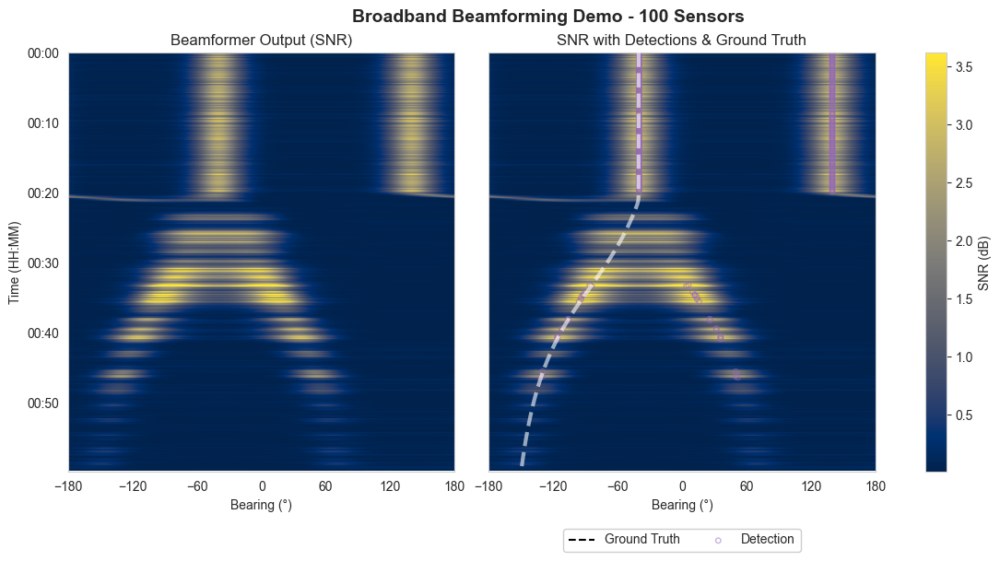

In [11]:
fig1, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=True, tight_layout=True)

# Left: Raw SNR
plotter.plot_snr(
    snr_array=snr_map[:-1],
    timesteps=timesteps[:-1],
    all_detections=[],
    truths=[],
    ax=axs[0],
    add_colorbar=False,
)
axs[0].set_title("Beamformer Output (SNR)")

# Right: SNR with detections and truth
_, im = plotter.plot_snr(
    snr_array=snr_map[:-1],
    timesteps=timesteps[:-1],
    all_detections=detections_for_plotter[:-1],
    truths=[relative_bearing_ground_truth],
    ax=axs[1],
    add_colorbar=False,
)
axs[1].set_ylabel("")
axs[1].set_title("SNR with Detections & Ground Truth")

# Add shared colorbar
fig1.colorbar(im, ax=axs.tolist(), label="SNR (dB)")

plt.suptitle(
    f"Broadband Beamforming Demo - {ARRAY_PARAMS['num_sensors']} Sensors",
    fontsize=14,
    fontweight="bold",
    y=1.02,
)
plt.show()

## 12. Plot Beamformed SNR at Middle Timestep

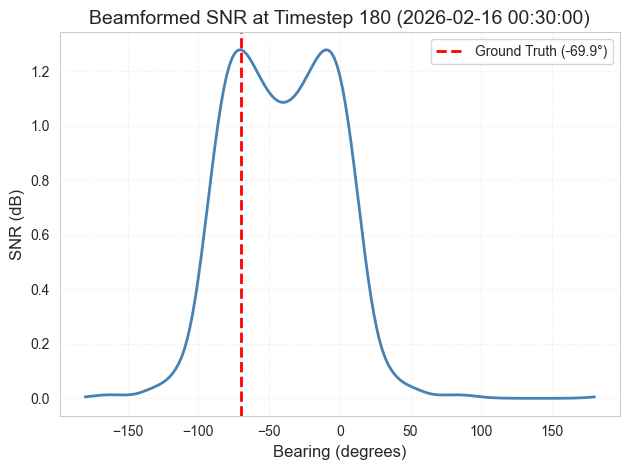

In [12]:
fig3, ax_middle = plt.subplots()

middle_timestep_idx = SIM_PARAMS["num_steps"] // 2
middle_snr = snr_map[middle_timestep_idx, :]
middle_time = timesteps[middle_timestep_idx]

steering_azimuths_deg = np.rad2deg(STEER_PARAMS["steering_azimuths_rad"])
ax_middle.plot(steering_azimuths_deg, middle_snr, linewidth=2, color="steelblue")
ax_middle.set_xlabel("Bearing (degrees)", fontsize=12)
ax_middle.set_ylabel("SNR (dB)", fontsize=12)
ax_middle.set_title(
    f"Beamformed SNR at Timestep {middle_timestep_idx} ({middle_time})", fontsize=14
)
ax_middle.grid(True, alpha=0.3)

# Mark ground truth bearing
gt_bearing_deg = np.rad2deg(gt_relative_bearings[middle_timestep_idx])
ax_middle.axvline(
    gt_bearing_deg,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Ground Truth ({gt_bearing_deg:.1f}°)",
)

# Mark detections at this timestep if any
if len(detections_for_plotter[middle_timestep_idx]) > 0:
    for det in detections_for_plotter[middle_timestep_idx]:
        det_bearing_deg = np.rad2deg(det.state_vector[0])
        ax_middle.axvline(
            det_bearing_deg,
            color="green",
            linestyle=":",
            linewidth=1.5,
            label=f"Detection ({det_bearing_deg:.1f}°)",
        )

ax_middle.legend(fontsize=10)
plt.tight_layout()
plt.show()

## 13. Plot Range Between Platform and Target Over Time

This plot shows how the platform's maneuver affects the range, which is key for TMA observability.

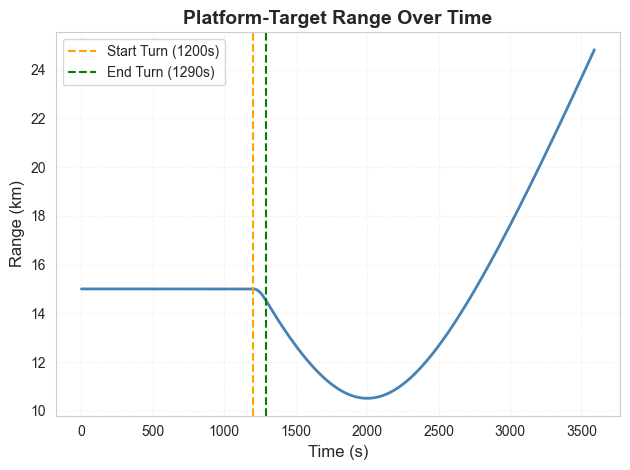

In [13]:
fig4, ax_range = plt.subplots()

# Convert timesteps to seconds for x-axis
time_seconds = [(t - SIM_PARAMS["start_time"]).total_seconds() for t in timesteps]

ax_range.plot(time_seconds, gt_ranges / 1000.0, linewidth=2, color="steelblue")
ax_range.set_xlabel("Time (s)", fontsize=12)
ax_range.set_ylabel("Range (km)", fontsize=12)
ax_range.set_title("Platform-Target Range Over Time", fontsize=14, fontweight="bold")
ax_range.grid(True, alpha=0.3)

# Add vertical lines at maneuver transitions
leg1_time = leg1.total_seconds()
leg2_time = leg1_time + leg2.total_seconds()
ax_range.axvline(
    leg1_time,
    color="orange",
    linestyle="--",
    linewidth=1.5,
    label=f"Start Turn ({leg1_time:.0f}s)",
)
ax_range.axvline(
    leg2_time, color="green", linestyle="--", linewidth=1.5, label=f"End Turn ({leg2_time:.0f}s)"
)

ax_range.legend(loc="best", fontsize=10)
plt.tight_layout()
plt.show()

## 14. Create Animated World View with Towed Array

Generate an animation showing the platform, towed array, and target motion over time. The animation runs for 1 minute (60 seconds) and repeats.

**Note**: Run this cell to generate the animation. It will display all sensor positions in the towed array at each timestep.

In [17]:
# from IPython.display import HTML, display

# fig5, ax_anim = plt.subplots()

# # Extract positions
# target_x = [state.state_vector[0] for state in target_ground_truth]
# target_y = [state.state_vector[2] for state in target_ground_truth]

# platform_x = []
# platform_y = []
# array_x = []
# array_y = []

# for timestamp in timesteps:
#     platform_state = platform.get_platform_state_at(timestamp)
#     platform_x.append(platform_state.host.state.state_vector[0])
#     platform_y.append(platform_state.host.state.state_vector[2])

#     array_center = np.mean(platform_state.array.state_vector, axis=1)
#     array_x.append(array_center[0])
#     array_y.append(array_center[1])

# # Set up plot limits based on trajectory extents
# all_x = platform_x + array_x + target_x
# all_y = platform_y + array_y + target_y
# x_margin = (max(all_x) - min(all_x)) * 0.5
# y_margin = (max(all_y) - min(all_y)) * 0.1
# ax_anim.set_xlim(min(all_x) - x_margin, max(all_x) + x_margin)
# ax_anim.set_ylim(min(all_y) - y_margin, max(all_y) + y_margin)
# ax_anim.set_xlabel('X Position (m)', fontsize=12)
# ax_anim.set_ylabel('Y Position (m)', fontsize=12)
# ax_anim.grid(True, alpha=0.3)
# ax_anim.set_aspect('equal')

# # Initialize plot elements
# target_trail, = ax_anim.plot([], [], 'r-', alpha=0.3, linewidth=1, label='Target Trail')
# target_point, = ax_anim.plot([], [], 'ro', markersize=12, label='Target')
# platform_trail, = ax_anim.plot([], [], 'b-', alpha=0.3, linewidth=1, label='Platform Trail')
# platform_point, = ax_anim.plot([], [], 'bs', markersize=10, label='Platform')
# array_sensors, = ax_anim.plot([], [], 'g.', markersize=4, alpha=0.6, label='Array Sensors')
# array_center, = ax_anim.plot([], [], 'g^', markersize=8, label='Array Center')

# ax_anim.legend(loc='upper left', fontsize=10)

# def init():
#     """Initialize animation."""
#     target_trail.set_data([], [])
#     target_point.set_data([], [])
#     platform_trail.set_data([], [])
#     platform_point.set_data([], [])
#     array_sensors.set_data([], [])
#     array_center.set_data([], [])
#     ax_anim.set_title('')
#     return target_trail, target_point, platform_trail, platform_point, array_sensors, array_center

# def animate(frame_idx):
#     """Update animation frame."""
#     # Update trails (up to current frame)
#     target_trail.set_data(target_x[:frame_idx+1], target_y[:frame_idx+1])
#     platform_trail.set_data(platform_x[:frame_idx+1], platform_y[:frame_idx+1])

#     # Update current positions
#     target_point.set_data([target_x[frame_idx]], [target_y[frame_idx]])
#     platform_point.set_data([platform_x[frame_idx]], [platform_y[frame_idx]])
#     array_center.set_data([array_x[frame_idx]], [array_y[frame_idx]])

#     # Get all sensor positions at this timestep
#     timestamp = timesteps[frame_idx]
#     platform_state = platform.get_platform_state_at(timestamp)
#     sensor_positions = platform_state.array.state_vector  # Shape: (3, num_sensors)
#     array_sensors.set_data(sensor_positions[0, :], sensor_positions[1, :])

#     # Update title with timestamp
#     ax_anim.set_title(f'Ground Truth World View - {timestamp.strftime("%H:%M:%S")}',
#                      fontsize=14, fontweight='bold')

#     return target_trail, target_point, platform_trail, platform_point, array_sensors, array_center

# # Calculate frame interval for 1 minute animation
# animation_duration_s = 60.0  # 1 minute
# num_frames = SIM_PARAMS["num_steps"]
# interval_ms = (animation_duration_s * 1000) / num_frames

# anim = FuncAnimation(
#     fig5,
#     animate,
#     init_func=init,
#     frames=num_frames,
#     interval=interval_ms,
#     blit=False,
#     repeat=True
# )

# plt.close()

# display(HTML(anim.to_jshtml()))

In [18]:
from nereus.plotter import CartesianPlotter
from IPython.display import HTML, display

style_guide = {"figure": {"figsize": (6.4, 6.4), "font_size": 10}}

# Plot the cartesian track
plotter = CartesianPlotter(style_guide=style_guide, offset=1000)

_, anim = plotter.animate(
    truths=[target_ground_truth],
    tracks=[],
    all_detections=[],  # No detections because they are only bearings
    mapping=[0, 2],
    platforms=[platform],
    timesteps=timesteps,
    plot_uncertainty=True,
)

plt.close()

display(HTML(anim.to_jshtml()))

In [19]:
# Print summary statistics
print("=" * 80)
print("Summary:")
print("=" * 80)
print(f"  Simulation Method: Broadband STFT + Frequency-Domain Beamforming")
print(f"  Total Duration: {total_duration_s} s across {SIM_PARAMS['num_steps']} timesteps")
print(f"  Array: {ARRAY_PARAMS['num_sensors']} sensors, {BF_PARAMS['shading']} shading")
print(f"  Signal Frequencies: {TARGET_PARAMS['frequencies_hz']} Hz")
print(f"  Noise Level: {20 * np.log10(NOISE_PARAMS['amplitude_upa']):.1f} dB re 1 µPa")
print(f"  Steering Directions: {len(STEER_PARAMS['steering_azimuths_rad'])}")
print(f"  Total Detections: {sum(len(det_set) for _, det_set in all_detections)}")
print(
    f"  Detection Rate: {np.mean([len(det_set) > 0 for det_set in detections_for_plotter]) * 100:.1f}%"
)
print()
print("Platform Maneuver:")
print(f"  Leg 1: {leg1.total_seconds():.0f} s (straight)")
print(f"  Leg 2: {leg2.total_seconds():.0f} s (90° left turn)")
print(f"  Leg 3: {leg3.total_seconds():.0f} s (straight)")
print()
print("Range Statistics:")
print(f"  Initial: {gt_ranges[0] / 1000:.2f} km")
print(f"  Final: {gt_ranges[-1] / 1000:.2f} km")
print(f"  Minimum: {np.min(gt_ranges) / 1000:.2f} km")
print(f"  Maximum: {np.max(gt_ranges) / 1000:.2f} km")

Summary:
  Simulation Method: Broadband STFT + Frequency-Domain Beamforming
  Total Duration: 3600.0 s across 360 timesteps
  Array: 100 sensors, blackman shading
  Signal Frequencies: [ 60.  85. 120. 200.] Hz
  Noise Level: 45.0 dB re 1 µPa
  Steering Directions: 181
  Total Detections: 258
  Detection Rate: 35.8%

Platform Maneuver:
  Leg 1: 1200 s (straight)
  Leg 2: 90 s (90° left turn)
  Leg 3: 2310 s (straight)

Range Statistics:
  Initial: 15.00 km
  Final: 24.81 km
  Minimum: 10.51 km
  Maximum: 24.81 km
